# Our Project: 改良原有FIR滤波器项目以更好滤除鸟类声音
## 01:DSP & Python
>我们的项目在原有FIR滤波器项目实验的代码基础上，着重改善了其**滤波功能**，使其能更好地滤除鸟类声音。\
\
>项目使用**Xilink**的[DSP-PYNQ](https://github.com/1176208465/FIR-filter-removes-bird-sounds)，并利用**Xilink Vitis HLS**生成的**FIR IP核**实现音频滤波操作。
### 原始混合音频信号
在改善的项目中，我们仍然采用`bird.wav`作为原始音频信号，其分别包含两种鸟类（*麻鹬*与*麻雀*）的叫声，原始音频如下：

In [21]:
from IPython.display import Audio
Audio("birds.wav");

### 分析音频信号特点
一般来说，分离声音可从声音的不同特性着手分析
- **频谱特性**：不同声音在频域上具有不同的频谱特性。频谱表示声音信号在不同频率上的能量分布。通过分析不同声音的频谱特性，可以尝试进行区分。
- **时域特性**：不同声音在时域上具有不同的波形特征。时域表示声音信号随时间的变化情况。通过分析不同声音的时域特性，例如**波形形状、振幅、持续时间**等，可以帮助进行声音分离。
- **时频特性**：不同声音在时频域上的特性可以提供额外的信息。时频分析方法，如**短时傅里叶变换（STFT）、小波变换**等，可以将声音信号转换为时频表示，从而捕捉到声音在不同时间和频率上的变化特征。
- **空间特性**：如果混合声音是由多个声源同时发出并被多个麦克风接收到的，那么声音在空间上具有位置和方向信息。通过利用**麦克风阵列的时延和方向性**，可以从空间角度上对声音进行分离。
- **音色特性**：不同声音的音色（Timbre）有所差异。音色是指声音的独特音质特征，由声音的频谱组成。通过分析**不同声音的音色特性**，可以区分它们。

根据原始文件，`bird.wav`中的**时域特性**、**音色特性**等信息较少，难以直接从这些方面进行分析；

而根据原始音频信号，查阅资料：

+ **麻鹬**：频率**较低**、鸣叫时长**较短**
+ **麻雀**：频率**较高**、鸣叫时长**较长**

<div style='max-width: 1005px;'>
<div style='width:40%; float:left; text-align:center;'>
    <img src="./curlew.jpg"/>
    <b>Curlew</b> <br/>Photo by Vedant Raju Kasambe <br/> <a href="https://creativecommons.org/licenses/by-sa/4.0/deed.en">Creative Commons Attribution-Share Alike 4.0</a>
</div>
<div style='width:40%; float:right; text-align:center;'>
    <img src="./chaffinch.jpg"/>
    <b>Chaffinch</b> <br/>Photo by Charles J Sharp <br/> <a href="https://creativecommons.org/licenses/by/3.0/deed.en">Creative Commons Attribution 3.0</a>
</div>
</div>

因此，下面我们将着重从频率入手，采取数字信号处理方法分离音频信号并利用硬件函数进行加速。

### 音频信号读入
首先，我们使用**SciPy**中的`wavfile`模块实现信号接入：

In [10]:
#Introducing the wavfile module
from scipy.io import wavfile

#Access to audio signals
fs, aud_in = wavfile.read("./birds.wav")

>**其中**，**fs**为采样频率，**aud_in**为原始数据。

在整个数据写入过程中，我们采用**44.1KHz**的采样频率，并以**int16**的形式保存数据，统计共有**554112**个采样点。

其相关具体数据打印均如下：

In [11]:
print("频率：",fs)
print("数据类型：",type(aud_in))
print("采样点个数：",len(aud_in))
print("保存数据类型：",aud_in.dtype)
print("随机抽样部分数据：",aud_in[10000:10009])

频率： 44100
数据类型： <class 'numpy.ndarray'>
采样点个数： 554112
保存数据类型： int16
随机抽样部分数据： [-37  25 128 210 183 202 278 310 300]


### 数据可视化
>为更好地展现两种鸟类频率方面特征的变化，我们通过绘制频谱图的方式对数据进行可视化操作。

绘制图形方面，考虑到`plotly`在图形绘制方面的强大功能，这里我们应用其中的底层API对上述运用`SciPy`中写入的数据进行绘制。

在绘制图形过程中，我们遇到了来自`SciPy`的*FurtureWaring*警告。因此，这里我们需要先对此警告进行屏蔽处理。 

In [12]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

其次，为解决默认情况下交互式`Ploty`图表无法在**Jupyter**中正确显示的问题，我们使用`plotly.offline`模块中的***init_notebook_mode***函数对其进行初始化：

In [13]:
# Initialize Plotly notebook mode
py.init_notebook_mode(connected=True)

NameError: name 'py' is not defined

在处理完引入`Scipy`库带来的警告后，我们绘制频谱图如下：

In [22]:
import plotly.graph_objs as go
import plotly.offline as py
from scipy.signal import spectrogram, decimate
import numpy as np

# Initialize Plotly notebook mode
py.init_notebook_mode(connected=True)

def plot_spectrogram(samples, fs, decimation_factor=3, max_heat=50, mode='2D'):
    
    # Optionally decimate input
    if decimation_factor>1:
        samples_dec = decimate(samples, decimation_factor, zero_phase=True)
        fs_dec = int(fs / decimation_factor)
    else:
        samples_dec = samples
        fs_dec = fs

    # Calculate spectrogram (an array of FFTs from small windows of our signal)
    f_label, t_label, spec_data = spectrogram(
        samples_dec, fs=fs_dec, mode="magnitude"
    )
    
    # Make a plotly heatmap/surface graph
    layout = go.Layout(
        height=500,
        # 2D axis titles
        xaxis=dict(title='Time (s)'),
        yaxis=dict(title='Frequency (Hz)'),
        # 3D axis titles
        scene=dict(
            xaxis=dict(title='Time (s)'),
            yaxis=dict(title='Frequency (Hz)'),
            zaxis=dict(title='Amplitude')
        )
    )
    
    trace = go.Heatmap(
        z=np.clip(spec_data,0,max_heat),
        y=f_label,
        x=t_label
    ) if mode=='2D' else go.Surface(
        z=spec_data,
        y=f_label,
        x=t_label
    )
    
    py.iplot(dict(data=[trace], layout=layout))


plot_spectrogram(aud_in, fs, mode='2D')

通过上图，我们发现：
- **麻鹬**：声频主要位于**1.2-2.6Hz**区间（图下方亮黄色区域）
- **麻雀**：声频主要位于**3.0-5.0Hz**区间（图上方暗黄色区域）

以提取麻雀声为例，下面的部分我们将设计**FIR**滤波器，首先滤除较为低频的麻鹬声。

### FIR滤波器 in Python
>为了实现对麻鹬声的滤除，我们考虑在**Python**中设计**FIR**滤波器，通过滤波器完成分离功能。

具体到实现方法，我们可以采用`Scipy`中的**信号处理模块**中的`firwin`与`freqz`模块。其中：
- **firwin**:用于设计滤波器的 ***FIR\(Finite Impulse Response\)***系数。它可以生成具有指定特性的 FIR 滤波器的系数，如**低通滤波器**、**高通滤波器**、**带通滤波器**等。firwin函数的主要参数包括**滤波器阶数\(order\)**、**截止频率\(cutoff\)**、**滤波器类型\(type\)**、**窗函数\(window\)**等。通过调整这些参数，可以根据需要设计不同类型的 FIR 滤波器。
- **freqz**:用于计算滤波器的频率响应。给定滤波器的系数，**freqz函数**可以生成滤波器的频率响应曲线，通常以**幅度响应**和**相位响应**的形式呈现。频率响应曲线显示了滤波器在不同频率上的增益和相位变化情况。通过分析频率响应曲线，可以了解滤波器对信号的频率成分进行了怎样的处理。

根据上述对频谱图的分析，我们已知麻鹬声的分布范围（1.2-2.6Hz）。因此，我们可以设计一个高通滤波器，实现对2.8kHz下信号的过滤：

In [15]:
from scipy.signal import freqz, firwin

nyq = fs / 2.0
taps = 99

# Design high-pass filter with cut-off at 2.8 kHz
hpf_coeffs = firwin(taps, 2800/nyq, pass_zero=False)

freqs, resp = freqz(hpf_coeffs, 1)

sample_freqs = np.linspace(0, nyq, len(np.abs(resp)))

为更好优化滤波器性能，我们可以使用`matplotlib`中的`pyplot`模块对滤波数据进行可视化处理：

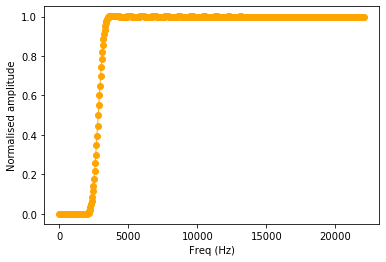

In [16]:
import matplotlib.pyplot as plt
#Curve and vertical/horizontal coordinate setting
plt.plot(sample_freqs, abs(resp), linewidth=1, color="orange", marker="o")
plt.xlabel("Freq (Hz)")
plt.ylabel("Normalised amplitude")
#Show image
plt.show()

观察输出信号频率图像，我们发现：
- **\(0，2.8\)kHz范围内**：输出接近为0；
- **2.8kHz左右**：数据剧烈波动；
- **\(2.8kHz,$\infty$\)**:输出接近为1。
    
上述图像表明我们实现了对**麻鹬\(2.8kHz以下\)**等低频信号的滤除，并尽量保留**麻雀\(2.8kHz以上\)**高频信号不失真，完成了**python**中**FIR**高通滤波器的设计环节。

## 02：DSP&Hardware
>在利用**python**软件实现**FIR**的编程后，在第二部分我们将采用***HLS+Vivado***相结合的方式完成**FIR**的组合设计。
### 数据处理及写入
为方便*HLS*中数据的写入，我们利用`numpy`模块将原始的数据类型从*float64*转化为*int32*，并对其进行量化操作：

In [17]:
#Data conversion
hpf_coeffs_quant = np.array(hpf_coeffs)

#quantitative operation
hpf_coeffs_hw = np.int32(hpf_coeffs_quant/np.max(abs(hpf_coeffs_quant)) * 2**15 - 1)

最终写入*IP*核中的系数如下：

In [18]:
print(hpf_coeffs_hw)

[  -13    -6     1     9    18    26    30    29    23    10    -8   -32
   -55   -75   -86   -82   -62   -25    26    84   140   182   200   183
   129    40   -75  -202  -317  -398  -424  -377  -254   -58   187   452
   693   863   915   812   532    69  -558 -1309 -2128 -2942 -3676 -4261
 -4637 32767 -4637 -4261 -3676 -2942 -2128 -1309  -558    69   532   812
   915   863   693   452   187   -58  -254  -377  -424  -398  -317  -202
   -75    40   129   183   200   182   140    84    26   -25   -62   -82
   -86   -75   -55   -32    -8    10    23    29    30    26    18     9
     1    -6   -13]


### Overlay加载
`Overlay`模块封装了ARM CPU与FPGA的PL部分进行交互的接口，通过`Overlay`模块可以实现以下功能：
1. 可通过`Overlay()`方法**将刚才生成的硬件设计加载到PL上;**
2. 通过`overlay.fir_wrap_0`语句，我们可以通过访问的Python对象的形式来**与IP交互。**

其具体代码实现如下：

In [19]:
from pynq import Overlay

#Load Bitstream
overlay = Overlay("./fir.bit")

#Get the instance of the FIR module
fir = overlay.fir_wrap_0

### 为IP使用分配内存
由于在*PL*中的*IP*访问*DRAM*之前，必须为其保留一些内存供*IP*使用，分配大小与地址。因此，这里我们使用`pynq.allocate`函数为*PL*中的*IP*分配可以使用的内存空间。

具体来说，`pynq.allocate`会分配物理上的连续内存，并返回一个`pynq.Buffer`表示已经分配缓冲区的对象。

我们分别为**输入**、**输出**和**权重**三个部分分配内存，数据类型为**int32**，即：

In [20]:
from pynq import allocate

#Calculate the length of the input sample
sample_len = len(aud_in)

#Allocating Input Buffers
input_buffer = allocate(shape=(sample_len,), dtype='i4')

#Allocate output buffers
output_buffer = allocate(shape=(sample_len,), dtype='i4')

#Allocation factor buffer
coef_buffer = allocate(shape=(99,), dtype='i4')

之后，我们将python的本地内存中的音频数据和系数数据复制到我们刚分配的内存中：

In [29]:
np.copyto(input_buffer, np.int32(aud_in))
np.copyto(coef_buffer, hpf_coeffs_hw)

其中，缓冲器本质上也是numpy数组，我们可以一些物理地址属性\(如*physical_address*\)访问其中数据，如：

In [28]:
#Extracts an array of input_buffer neutrons
input_buffer[10000:10009]

#Extracts an array of coef_buffer neutrons
coef_buffer[0:9]

#Get physical address 
coef_buffer.physical_address

377786368

### 配置IP
> - **对于内存空间的地址**：我们可直接使用*IP*中的**write**方法进行写入操作；
> - **对于数据长度**：我们可直接在相应寄存器中写值即可。

具体实现代码如下：

In [30]:
#Write the physical address to the control register of the FIR module
fir.s_axi_control.write(0x1c,input_buffer.physical_address)
fir.s_axi_control.write(0x10,output_buffer.physical_address)
fir.s_axi_control.write(0x28,coef_buffer.physical_address)

#Write the length to the control register of the FIR module
fir.s_axi_CTRL.write(0x10, sample_len)

### 启动IP
控制信号位于0x00地址，我们可以对其进行**写入**与**读取**操作来控制*IP* **启动**、**监听**是否完成：

In [31]:
import time

#Starting the FIR Module
fir.s_axi_CTRL.write(0x00, 0x01)

#Record start time
start_time = time.time()
while True:
    reg = fir.s_axi_CTRL.read(0x00)
    if reg != 1:
        break
        
#Record end time
end_time = time.time()

#computat the time
print("耗时：{}s".format(end_time - start_time))

耗时：0.021299123764038086s


我们可以在`output_buffer`中查看最终结果：

In [32]:
output_buffer[10000:10009]

PynqBuffer([-4340999,  2073422,  5686747,  -114713,  -862652,   491182,
             1283565,  4466583,  4497105])

### 结果可视化
> 与软件部分类似，这里我们仍然采用上述方法对硬件处理的结果进行可视化处理：

In [34]:
plot_spectrogram(output_buffer, fs, mode='2D', max_heat=np.max(abs(output_buffer)))

### 结果分析
根据最终结果，不难发现：
> - 相较于原信号，**低频部分都被较好的去除了**
> - 由于设计中对参数进行了量化，**值普遍偏大**

我们可以再对输出结果进行缩放，并将结果写入到音频`hpf_hw.wav`中并进行试听：

In [35]:
from IPython.display import Audio

scaled = np.int16(output_buffer/np.max(abs(output_buffer)) * 2**15 - 1)
wavfile.write('hpf_hw.wav', fs, scaled)
Audio('hpf_hw.wav')

我们可以发现麻鹬的声音已经被成功去除了，且麻雀的声音保留得较为清晰。


由此完成了本次**"改良原有FIR滤波器项目以更好滤除鸟类声音"**的全部设计。

## 心得体会
> 在本次项目的过程中，我们以滤除混杂鸟类音频信息为契机，从**硬件**、**软件**两方面深入体会到了***Vitis HLS***在实际工程应用中的种种便捷与强大之处;在***Python*** **编程**、**软硬件结合**方面,我们的能力也有着显著提升;而有着诸位业界“大牛”倾情分享，我们对未来的发展方向与行业发展规律也有了全新的理解与感悟。


> 我们相信，随着自身对**软硬件结合开发能力的不断掌握**及**理论知识的不断理解感悟**，我们终会在***FPGA*** **开发**的道路上越走越远！